# 3D Spiral Experiment: Neural ODE

In [1]:
!pip install git+https://github.com/rtqichen/torchdiffeq
# !wget https://raw.githubusercontent.com/cagatayyildiz/ODE2VAE/master/torch_bnn.py

  Cloning https://github.com/rtqichen/torchdiffeq to /tmp/pip-req-build-t5f9y8aw
  Running command git clone -q https://github.com/rtqichen/torchdiffeq /tmp/pip-req-build-t5f9y8aw
  Created wheel for torchdiffeq: filename=torchdiffeq-0.2.1-cp37-none-any.whl size=31204 sha256=facd009c60d7d143c531abf938da37d2f1e8658511e7e2260a821d2a577f0efe
  Stored in directory: /tmp/pip-ephem-wheel-cache-92uxkq6a/wheels/3f/76/69/01867bf3355c3bc8bae7e556b17b44c395b6cda5e76fd8ddc7
Successfully built torchdiffeq


In [10]:
import os
import time
import math
import numpy as np
import numpy.random as npr
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torchdiffeq import odeint

In [11]:
def generate_spiral3d(nspiral=1000,
                      ntotal=1000,
                      nsample=100,
                      start=0.,
                      stop=1,  # approximately equal to 6pi
                      noise_std=.1,
                      a=0.,
                      b=1.,
                      savefig=True):

    # add 1 all timestamps to avoid division by 0
    orig_ts = np.linspace(start, stop, num=ntotal)
    samp_ts = orig_ts[:nsample]

    # generate clock-wise and counter clock-wise spirals in observation space
    # with two sets of time-invariant latent dynamics
    zs_cw = stop + 1. - orig_ts
    rs_cw = a + b * 50. / zs_cw
    xs, ys = rs_cw * np.cos(zs_cw) - 5., rs_cw * np.sin(zs_cw)
    orig_traj_cw = np.stack((xs, ys, orig_ts), axis=1)

    zs_cc = orig_ts
    rw_cc = a + b * zs_cc
    xs, ys = rw_cc * np.cos(zs_cc) + 5., rw_cc * np.sin(zs_cc)
    orig_traj_cc = np.stack((xs, ys, orig_ts), axis=1)

    if savefig:
        plt.figure()
        ax = plt.axes(projection='3d')
        ax.plot3D(orig_traj_cw[:, 0], orig_traj_cw[:, 1], orig_traj_cw[:, 2], label='clock')
        ax.plot3D(orig_traj_cc[:, 0], orig_traj_cc[:, 1], orig_traj_cc[:, 2], label='counter clock')
        plt.legend()
        plt.show()
        plt.close()

    # sample starting timestamps
    orig_trajs = []
    samp_trajs = []
    for _ in range(nspiral):
        # don't sample t0 very near the start or the end
        t0_idx = npr.multinomial(
            1, [1. / (ntotal - 2. * nsample)] * (ntotal - int(2 * nsample)))
        t0_idx = np.argmax(t0_idx) + nsample

        cc = bool(npr.rand() > .5)  # uniformly select rotation
        orig_traj = orig_traj_cc if cc else orig_traj_cw
        orig_trajs.append(orig_traj)

        samp_traj = orig_traj[t0_idx:t0_idx + nsample, :].copy()
        samp_traj += npr.randn(*samp_traj.shape) * noise_std
        samp_trajs.append(samp_traj)

    # batching for sample trajectories is good for RNN; batching for original
    # trajectories only for ease of indexing
    orig_trajs = np.stack(orig_trajs, axis=0)
    samp_trajs = np.stack(samp_trajs, axis=0)

    return orig_trajs, samp_trajs, orig_ts, samp_ts

In [12]:
class LatentODEfunc(nn.Module):

    def __init__(self, latent_dim=4, nhidden=20):
        super(LatentODEfunc, self).__init__()
        self.elu = nn.ELU(inplace=True)
        self.fc1 = nn.Linear(latent_dim, nhidden)
        self.fc2 = nn.Linear(nhidden, nhidden)
        self.fc3 = nn.Linear(nhidden, latent_dim)
        self.nfe = 0

    def forward(self, t, x):
        self.nfe += 1
        out = self.fc1(x)
        out = self.elu(out)
        out = self.fc2(out)
        out = self.elu(out)
        out = self.fc3(out)
        return out


class RecognitionRNN(nn.Module):

    def __init__(self, latent_dim=4, obs_dim=3, nhidden=25, nbatch=1):
        super(RecognitionRNN, self).__init__()
        self.nhidden = nhidden
        self.nbatch = nbatch
        self.i2h = nn.Linear(obs_dim + nhidden, nhidden)
        self.h2o = nn.Linear(nhidden, latent_dim * 2)

    def forward(self, x, h):
        combined = torch.cat((x, h), dim=1)
        h = torch.tanh(self.i2h(combined))
        out = self.h2o(h)
        return out, h

    def initHidden(self):
        return torch.zeros(self.nbatch, self.nhidden)


class Decoder(nn.Module):

    def __init__(self, latent_dim=4, obs_dim=3, nhidden=20):
        super(Decoder, self).__init__()
        self.relu = nn.ReLU(inplace=True)
        self.fc1 = nn.Linear(latent_dim, nhidden)
        self.fc2 = nn.Linear(nhidden, obs_dim)

    def forward(self, z):
        out = self.fc1(z)
        out = self.relu(out)
        out = self.fc2(out)
        return out


class RunningAverageMeter(object):
    """Computes and stores the average and current value"""

    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count


def log_normal_pdf(x, mean, logvar):
    const = torch.from_numpy(np.array([2. * np.pi])).float().to(x.device)
    const = torch.log(const)
    return -.5 * (const + logvar + (x - mean) ** 2. / torch.exp(logvar))


def normal_kl(mu1, lv1, mu2, lv2):
    v1 = torch.exp(lv1)
    v2 = torch.exp(lv2)
    lstd1 = lv1 / 2.
    lstd2 = lv2 / 2.

    kl = lstd2 - lstd1 + ((v1 + (mu1 - mu2) ** 2.) / (2. * v2)) - .5
    return kl

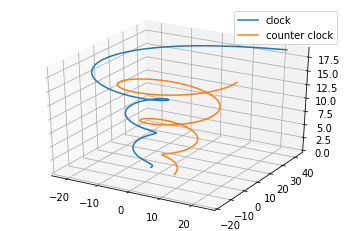

Iter: 25, running avg elbo: -136320.0925


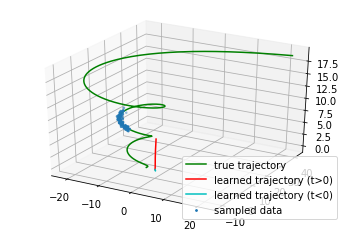

Iter: 50, running avg elbo: -121951.4953


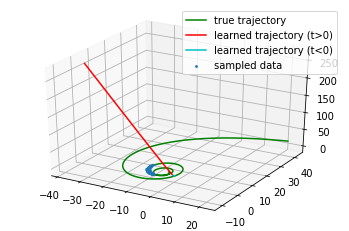

Iter: 75, running avg elbo: -110983.8266


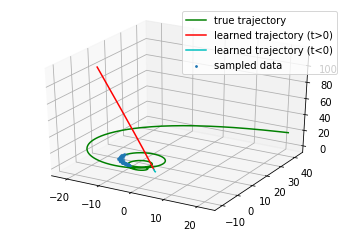

Iter: 100, running avg elbo: -103899.3621


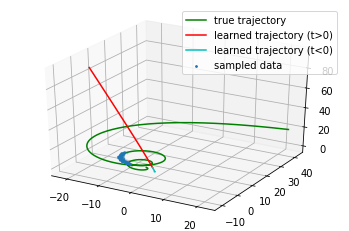

Iter: 125, running avg elbo: -98308.2380


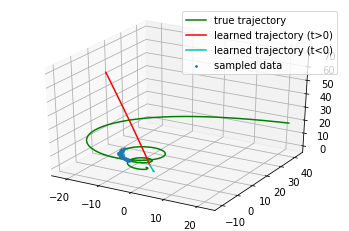

Iter: 150, running avg elbo: -93059.1871


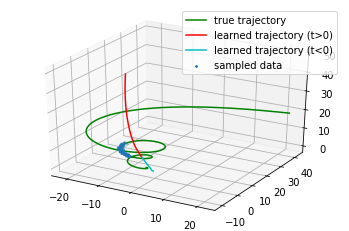

Iter: 175, running avg elbo: -87811.3069


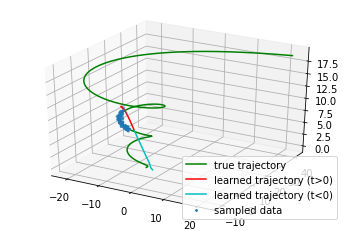

Iter: 200, running avg elbo: -83008.3273


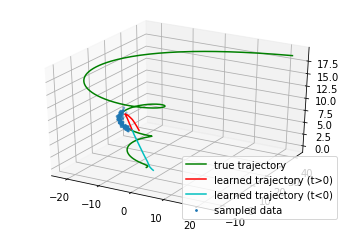

Iter: 225, running avg elbo: -78519.8356


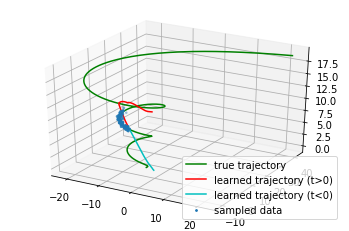

Iter: 250, running avg elbo: -74189.4614


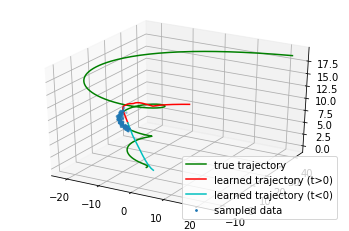

Stored ckpt at ./ckpt.pth
Iter: 275, running avg elbo: -69892.3530


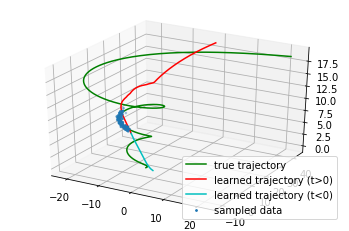

Iter: 300, running avg elbo: -65597.0343


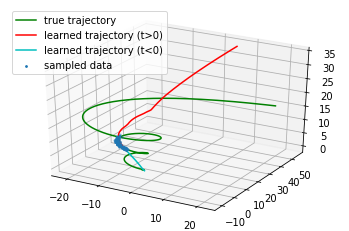

Iter: 325, running avg elbo: -61545.7958


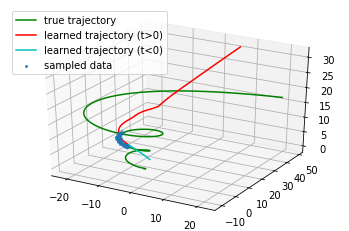

Iter: 350, running avg elbo: -57849.4802


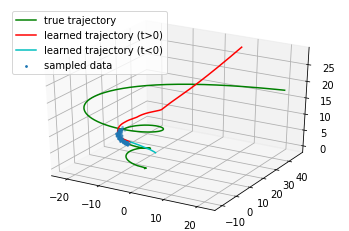

Iter: 375, running avg elbo: -54517.8731


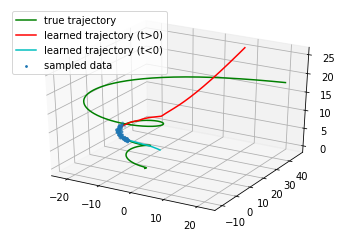

Iter: 400, running avg elbo: -51531.7695


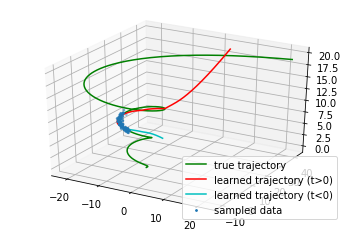

Iter: 425, running avg elbo: -48846.9263


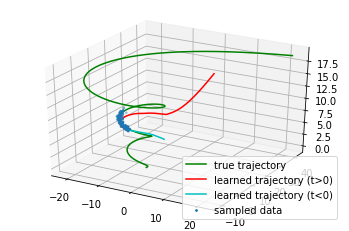

Iter: 450, running avg elbo: -46434.2212


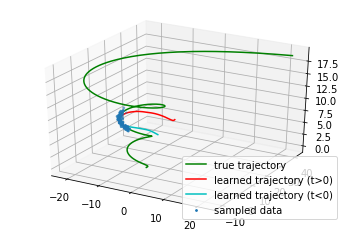

Iter: 475, running avg elbo: -44242.6689


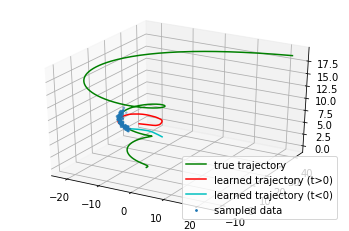

Iter: 500, running avg elbo: -42238.4130


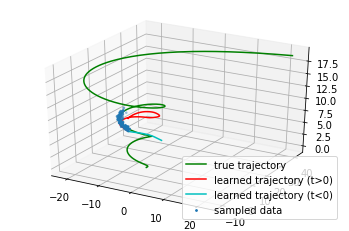

Stored ckpt at ./ckpt.pth
Iter: 525, running avg elbo: -40405.5466


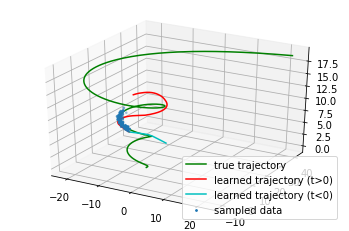

Iter: 550, running avg elbo: -38717.6558


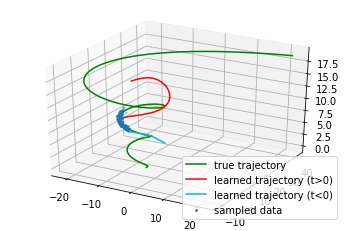

Iter: 575, running avg elbo: -37158.7348


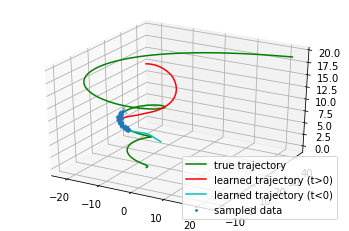

Iter: 600, running avg elbo: -35717.4058


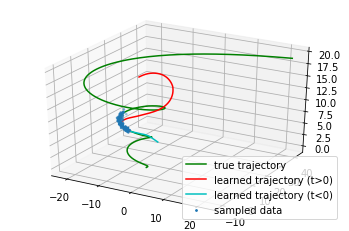

Iter: 625, running avg elbo: -34423.2229


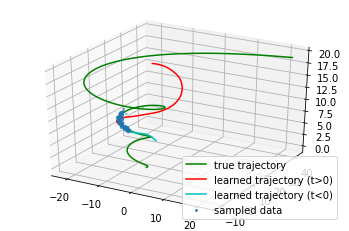

Iter: 650, running avg elbo: -33206.4519


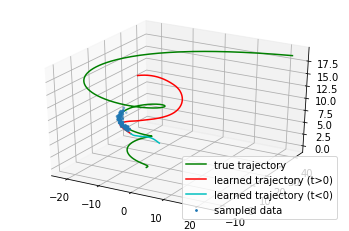

Iter: 675, running avg elbo: -32056.9672


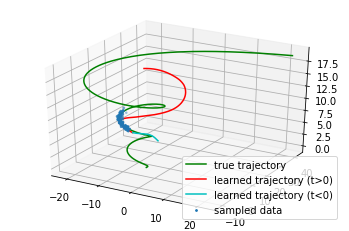

Iter: 700, running avg elbo: -30978.8455


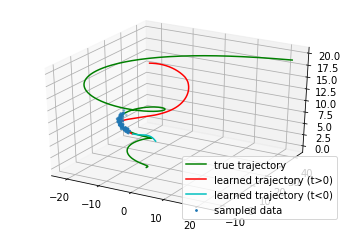

Iter: 725, running avg elbo: -29967.0898


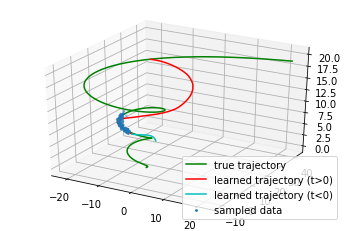

Iter: 750, running avg elbo: -29016.2848


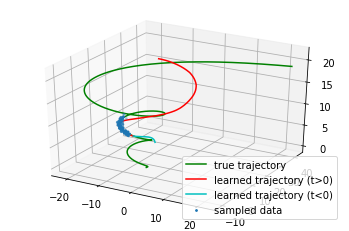

Stored ckpt at ./ckpt.pth
Iter: 775, running avg elbo: -28122.1047


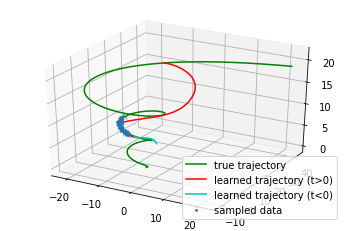

Iter: 800, running avg elbo: -27280.2418


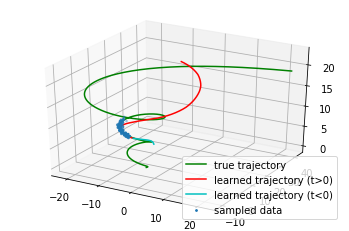

Iter: 825, running avg elbo: -26486.5146


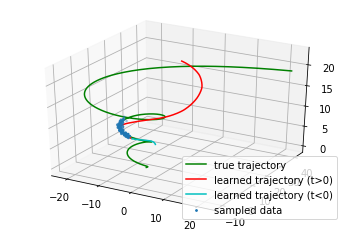

Iter: 850, running avg elbo: -25737.2074


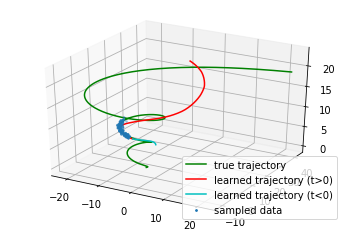

Iter: 875, running avg elbo: -25029.2176


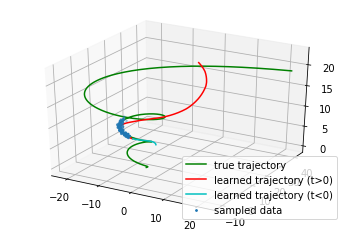

Iter: 900, running avg elbo: -24359.1703


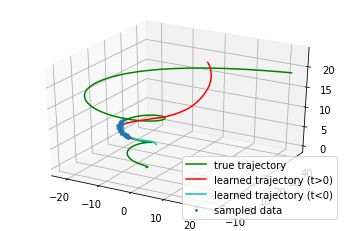

Iter: 925, running avg elbo: -23724.2075


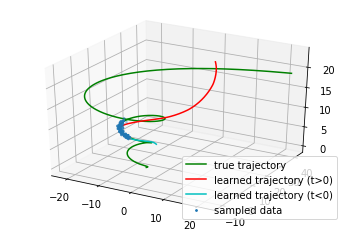

Iter: 950, running avg elbo: -23121.4334


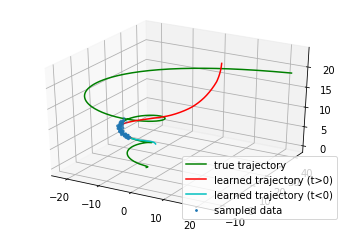

Iter: 975, running avg elbo: -22548.6360


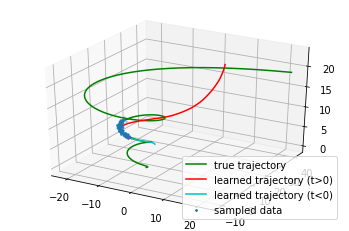

Iter: 1000, running avg elbo: -22003.7279


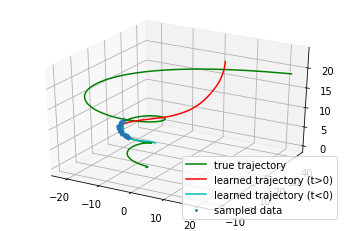

Stored ckpt at ./ckpt.pth
Iter: 1025, running avg elbo: -21484.8667


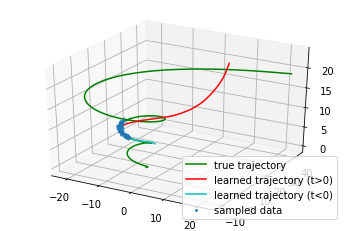

Iter: 1050, running avg elbo: -20990.0627


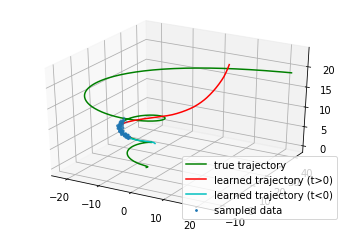

Iter: 1075, running avg elbo: -20517.6500


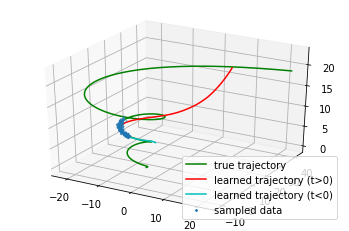

Iter: 1100, running avg elbo: -20066.0165


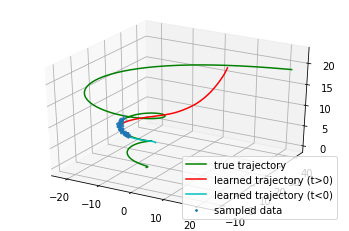

Iter: 1125, running avg elbo: -19633.9475


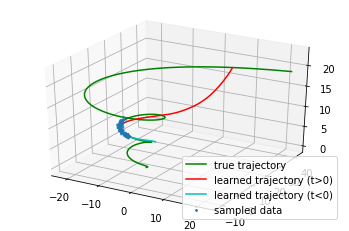

Iter: 1150, running avg elbo: -19220.2194


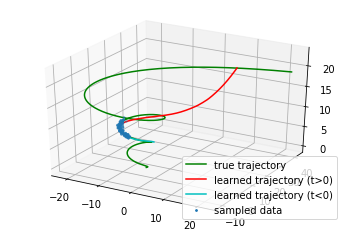

Iter: 1175, running avg elbo: -18823.7006


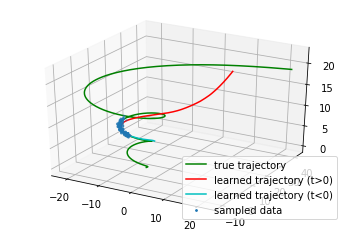

Iter: 1200, running avg elbo: -18443.1823


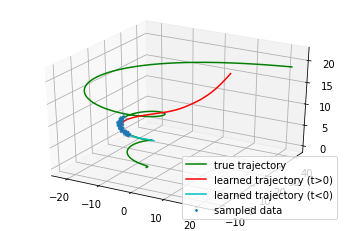

Iter: 1225, running avg elbo: -18077.7459


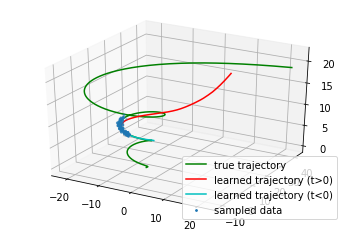

Iter: 1250, running avg elbo: -17726.6845


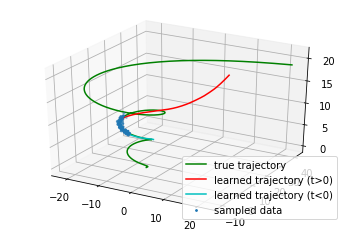

Stored ckpt at ./ckpt.pth
Iter: 1275, running avg elbo: -17389.1103


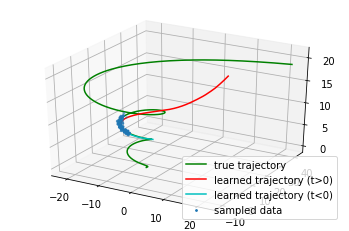

Iter: 1300, running avg elbo: -17064.2441


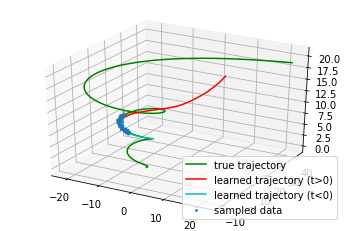

Iter: 1325, running avg elbo: -16751.4146


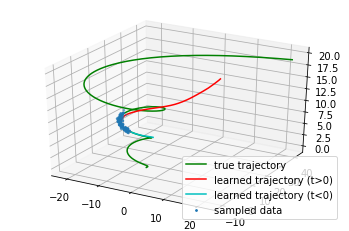

Iter: 1350, running avg elbo: -16449.9513


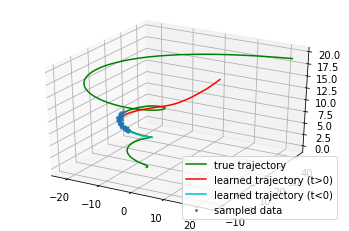

Iter: 1375, running avg elbo: -16159.2917


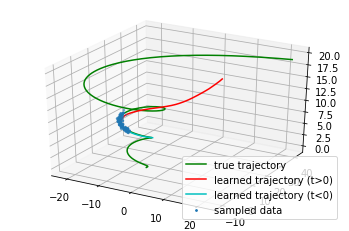

Iter: 1400, running avg elbo: -15878.8440


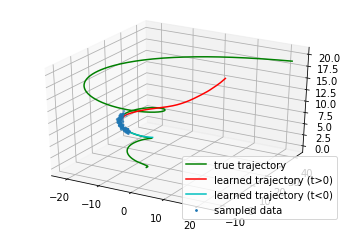

Iter: 1425, running avg elbo: -15608.0911


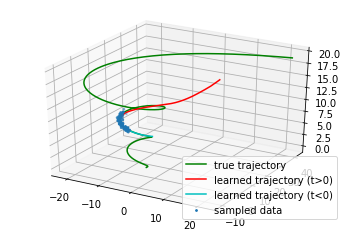

Iter: 1450, running avg elbo: -15346.5107


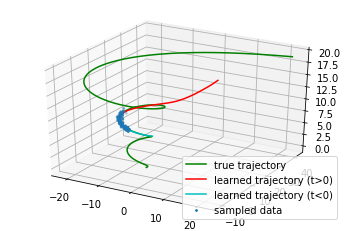

Iter: 1475, running avg elbo: -15093.6443


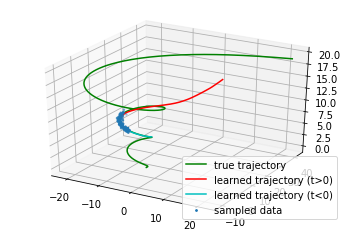

Iter: 1500, running avg elbo: -14849.0899


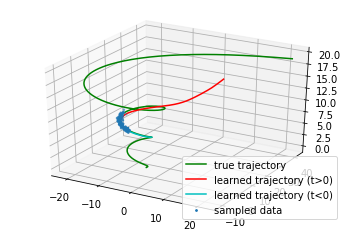

Stored ckpt at ./ckpt.pth
Iter: 1525, running avg elbo: -14612.4310


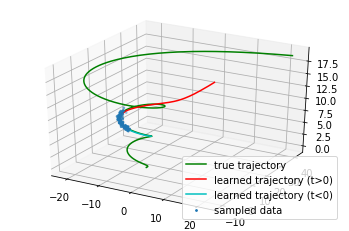

Iter: 1550, running avg elbo: -14383.3144


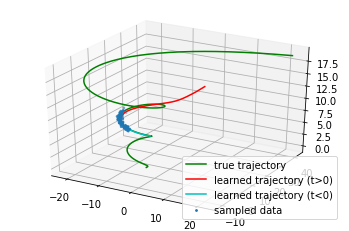

Iter: 1575, running avg elbo: -14161.5378


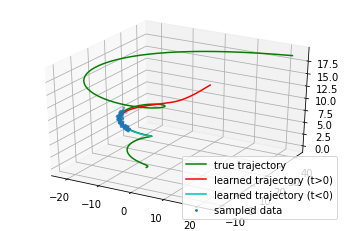

Iter: 1600, running avg elbo: -13946.8865


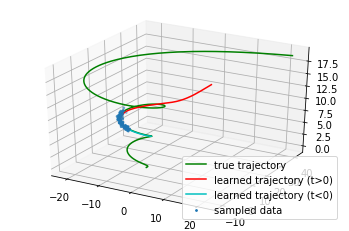

Iter: 1625, running avg elbo: -13738.8697


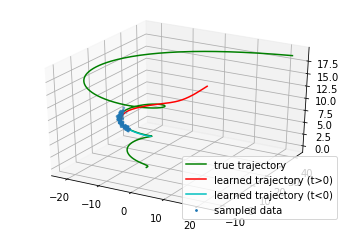

Iter: 1650, running avg elbo: -13537.2116


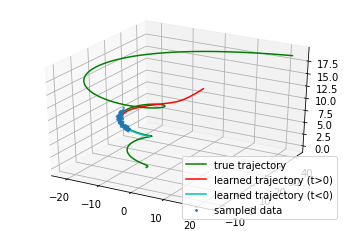

Iter: 1675, running avg elbo: -13341.5943


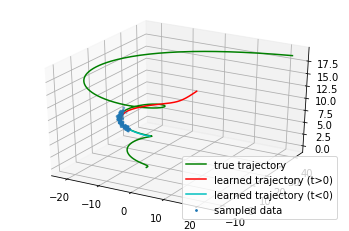

Iter: 1700, running avg elbo: -13151.7747


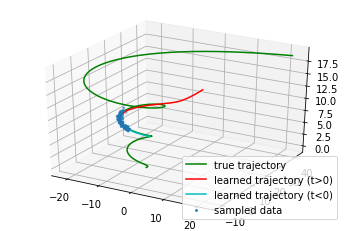

Iter: 1725, running avg elbo: -12967.3187


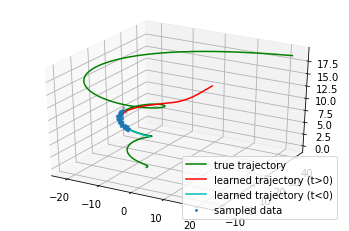

Iter: 1750, running avg elbo: -12787.9344


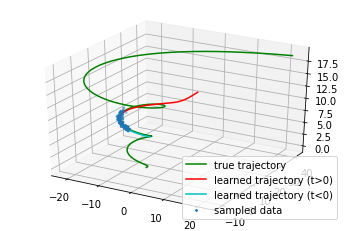

Stored ckpt at ./ckpt.pth
Iter: 1775, running avg elbo: -12613.4962


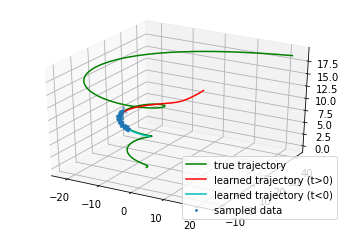

Iter: 1800, running avg elbo: -12443.9980


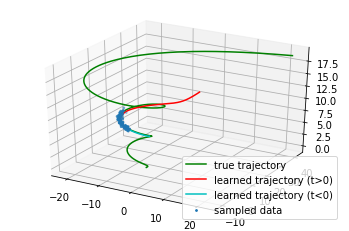

Iter: 1825, running avg elbo: -12279.2322


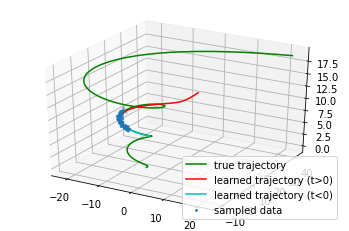

Iter: 1850, running avg elbo: -12118.9830


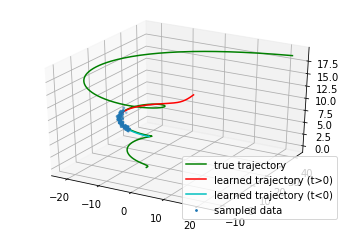

Iter: 1875, running avg elbo: -11962.2079


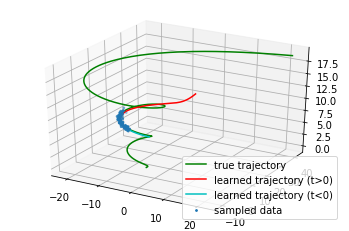

Iter: 1900, running avg elbo: -11809.2344


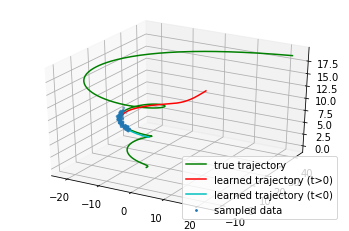

Iter: 1925, running avg elbo: -11660.1196


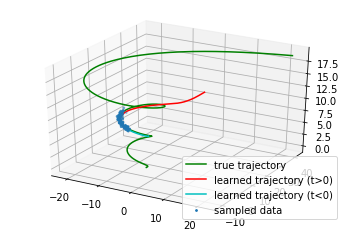

Iter: 1950, running avg elbo: -11514.7595


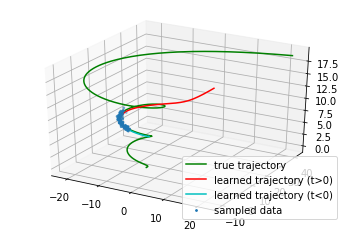

Iter: 1975, running avg elbo: -11373.0142


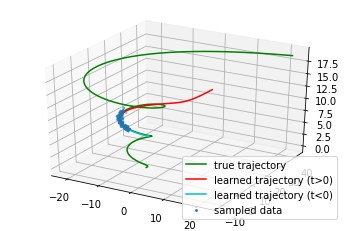

Iter: 2000, running avg elbo: -11234.7702


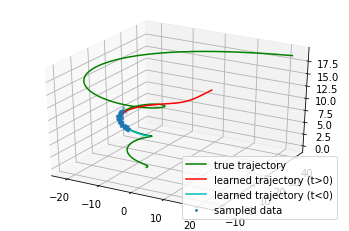

Stored ckpt at ./ckpt.pth
Iter: 2025, running avg elbo: -11099.9321


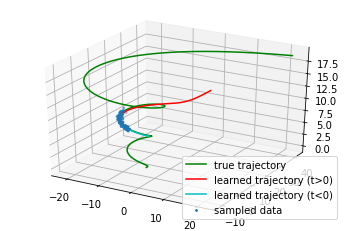

Iter: 2050, running avg elbo: -10968.3317


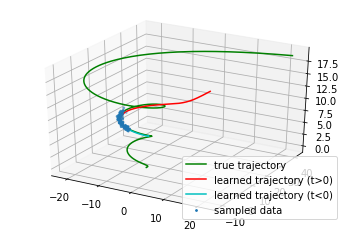

Iter: 2075, running avg elbo: -10839.8484


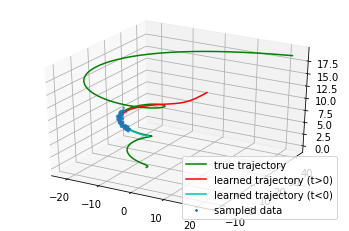

Iter: 2100, running avg elbo: -10714.3567


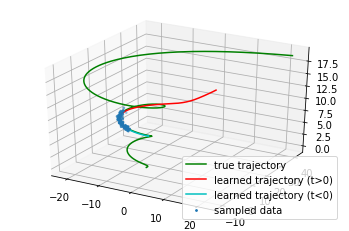

Iter: 2125, running avg elbo: -10591.7844


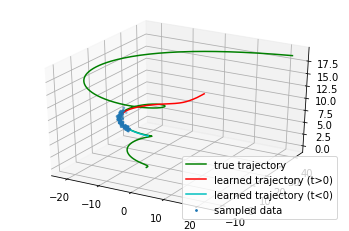

Iter: 2150, running avg elbo: -10472.0100


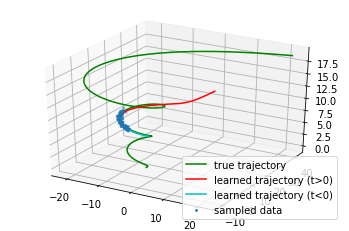

Iter: 2175, running avg elbo: -10354.9474


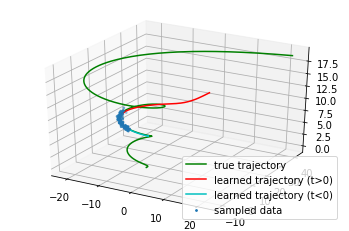

Iter: 2200, running avg elbo: -10240.5216


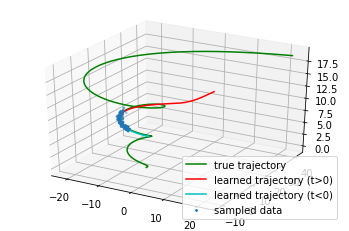

Iter: 2225, running avg elbo: -10128.6308


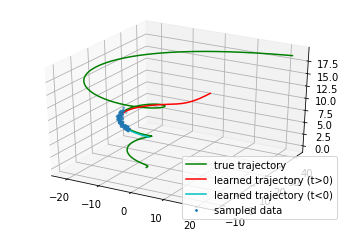

Iter: 2250, running avg elbo: -10019.1982


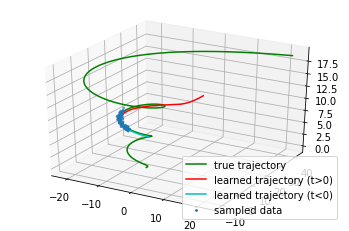

Stored ckpt at ./ckpt.pth
Iter: 2275, running avg elbo: -9912.1393


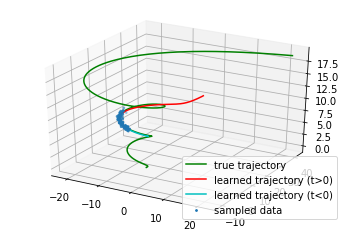

Iter: 2300, running avg elbo: -9807.3838


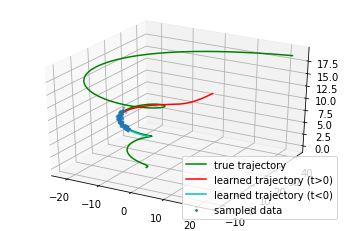

Iter: 2325, running avg elbo: -9704.8752


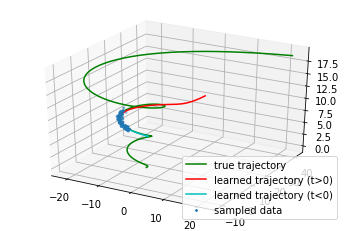

Iter: 2350, running avg elbo: -9604.5149


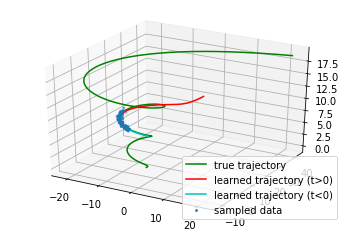

Iter: 2375, running avg elbo: -9506.2320


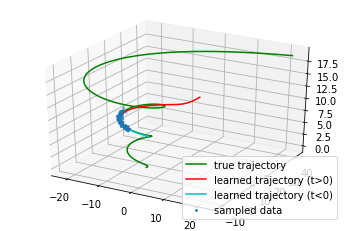

Iter: 2400, running avg elbo: -9409.9706


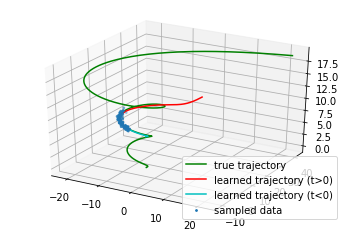

Iter: 2425, running avg elbo: -9315.6669


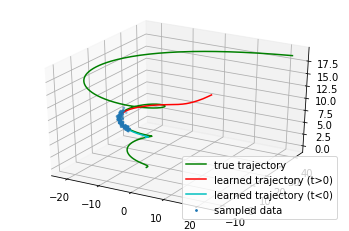

Iter: 2450, running avg elbo: -9223.2743


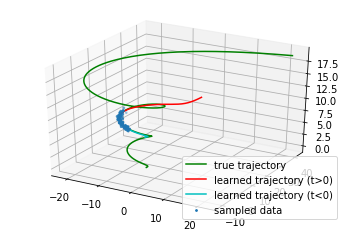

Iter: 2475, running avg elbo: -9132.7198


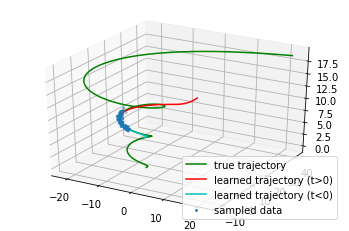

Iter: 2500, running avg elbo: -9043.9594


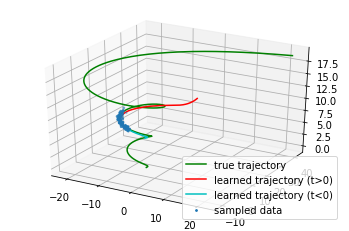

Stored ckpt at ./ckpt.pth
Iter: 2525, running avg elbo: -8956.9313


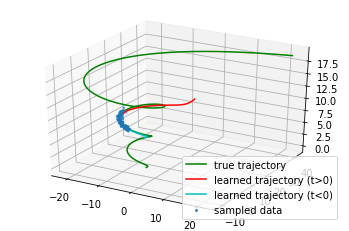

Iter: 2550, running avg elbo: -8871.5941


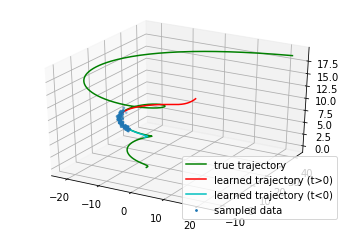

Iter: 2575, running avg elbo: -8787.9007


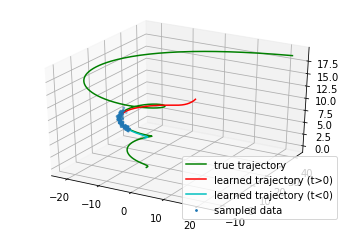

Iter: 2600, running avg elbo: -8705.7936


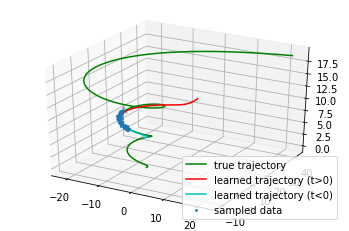

Iter: 2625, running avg elbo: -8625.2374


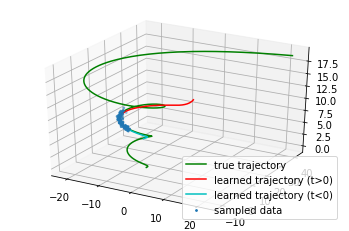

Iter: 2650, running avg elbo: -8546.1909


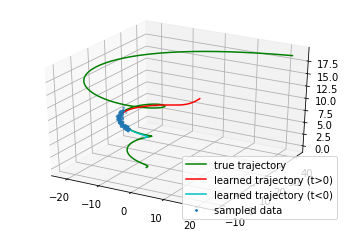

Iter: 2675, running avg elbo: -8468.5981


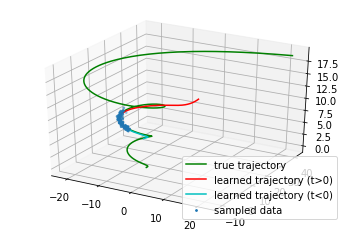

Iter: 2700, running avg elbo: -8392.4261


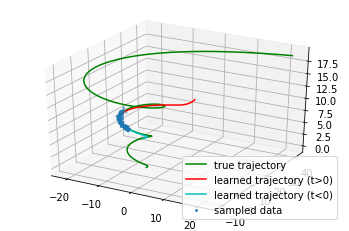

Iter: 2725, running avg elbo: -8317.6397


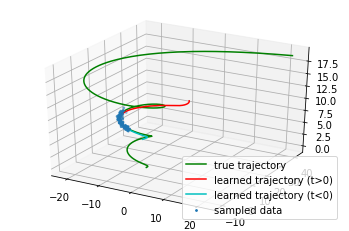

Iter: 2750, running avg elbo: -8244.1989


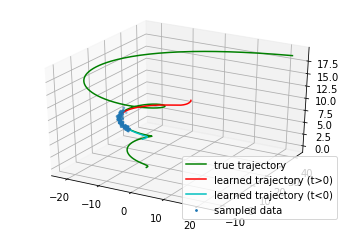

Stored ckpt at ./ckpt.pth
Iter: 2775, running avg elbo: -8172.0717


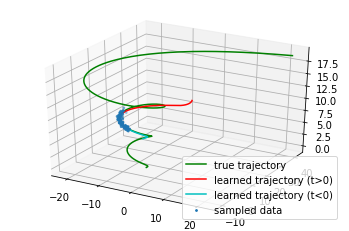

Iter: 2800, running avg elbo: -8101.2111


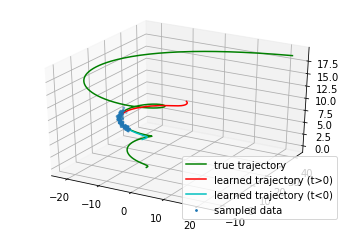

Iter: 2825, running avg elbo: -8031.5911


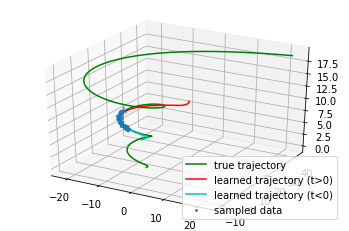

Iter: 2850, running avg elbo: -7963.1824


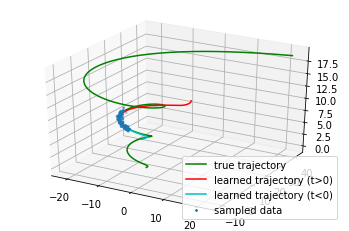

Iter: 2875, running avg elbo: -7895.9515


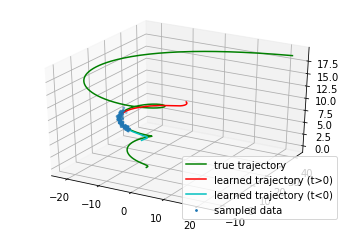

Iter: 2900, running avg elbo: -7829.8701


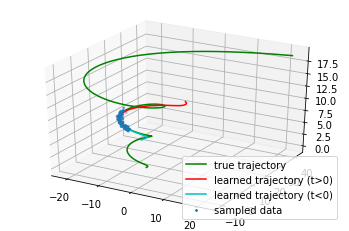

Iter: 2925, running avg elbo: -7764.9032


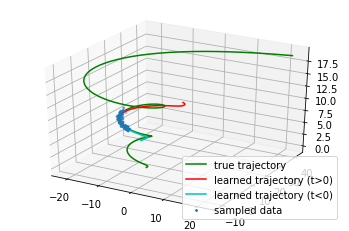

Iter: 2950, running avg elbo: -7701.0305


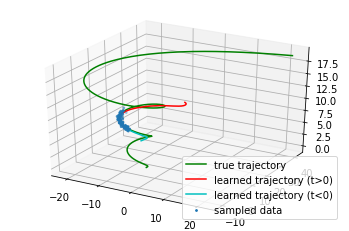

Iter: 2975, running avg elbo: -7638.4390


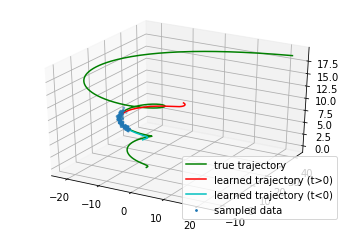

Iter: 3000, running avg elbo: -7577.2419


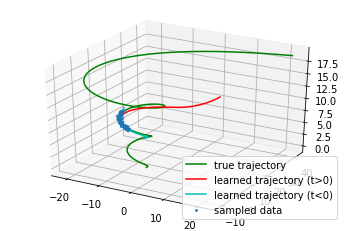

Stored ckpt at ./ckpt.pth
Iter: 3025, running avg elbo: -7518.8829


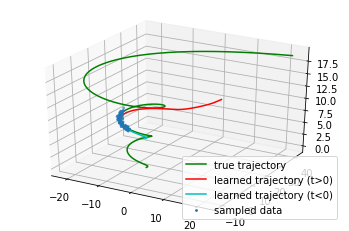

Iter: 3050, running avg elbo: -7468.4513


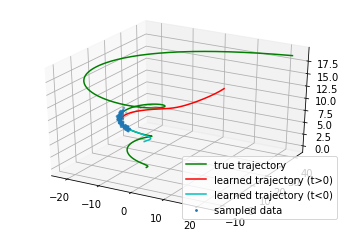

Iter: 3075, running avg elbo: -7431.7676


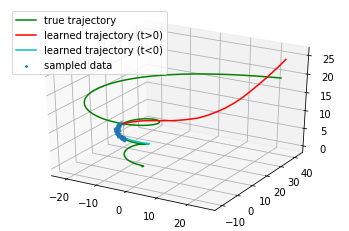

Iter: 3100, running avg elbo: -7379.1578


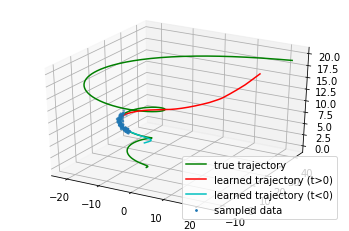

Iter: 3125, running avg elbo: -7322.9140


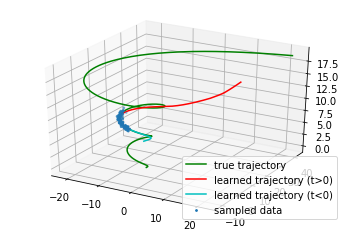

Iter: 3150, running avg elbo: -7267.0600


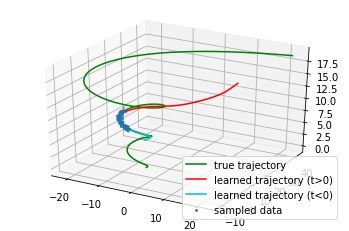

Iter: 3175, running avg elbo: -7211.9420


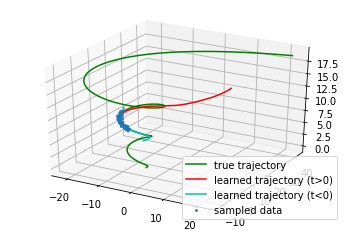

Iter: 3200, running avg elbo: -7157.6068


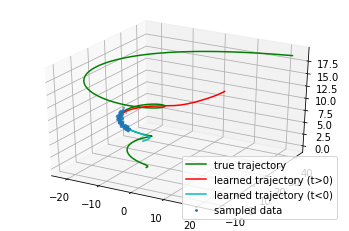

Iter: 3225, running avg elbo: -7104.0653


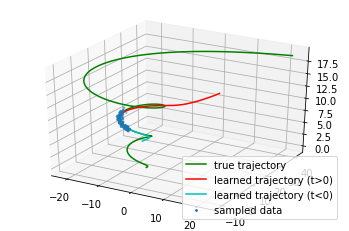

Iter: 3250, running avg elbo: -7051.3126


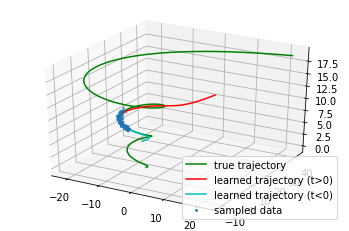

Stored ckpt at ./ckpt.pth
Iter: 3275, running avg elbo: -6999.3399


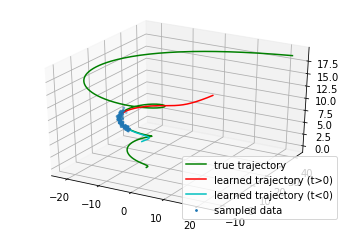

Iter: 3300, running avg elbo: -6948.1320


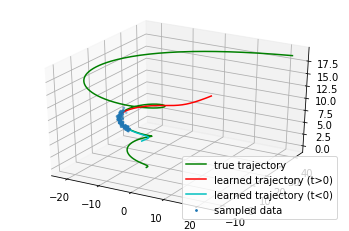

Iter: 3325, running avg elbo: -6897.6746


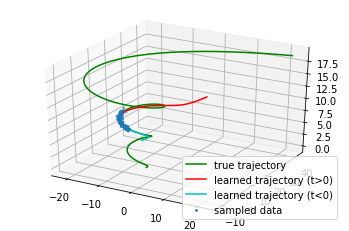

Iter: 3350, running avg elbo: -6847.9512


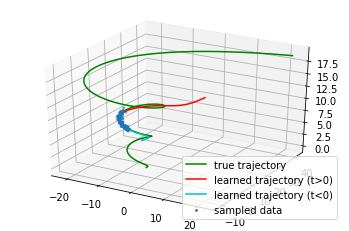

Iter: 3375, running avg elbo: -6798.9521


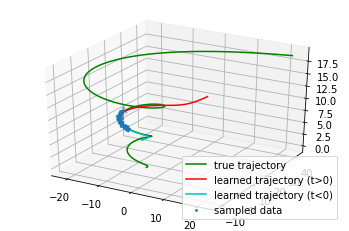

Iter: 3400, running avg elbo: -6750.6624


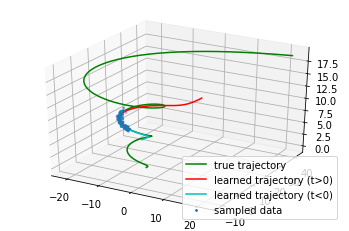

Iter: 3425, running avg elbo: -6703.0651


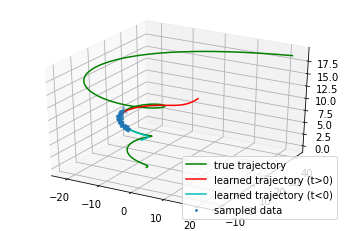

Iter: 3450, running avg elbo: -6656.1490


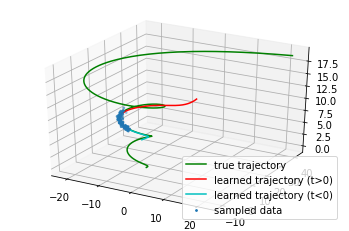

Iter: 3475, running avg elbo: -6609.8959


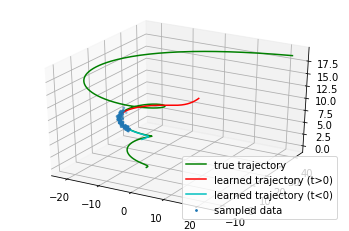

Iter: 3500, running avg elbo: -6564.2949


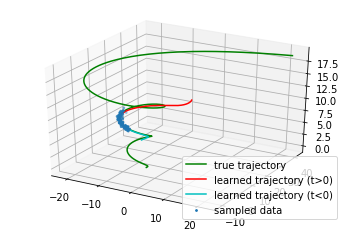

Stored ckpt at ./ckpt.pth
Iter: 3525, running avg elbo: -6519.3320


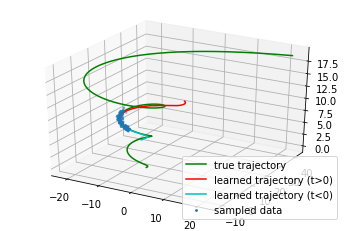

Iter: 3550, running avg elbo: -6474.9928


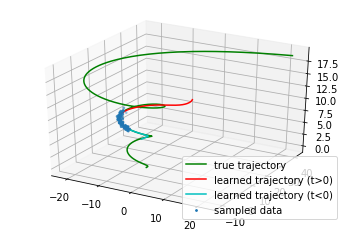

Iter: 3575, running avg elbo: -6431.2686


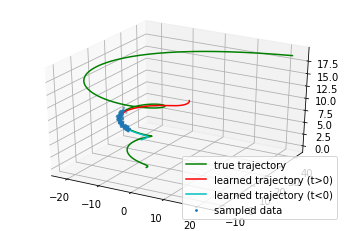

Iter: 3600, running avg elbo: -6388.1446


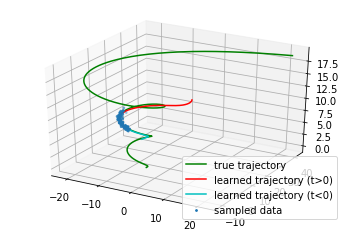

Iter: 3625, running avg elbo: -6345.6140


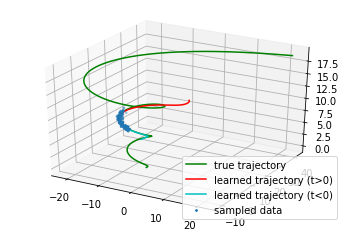

Iter: 3650, running avg elbo: -6303.6590


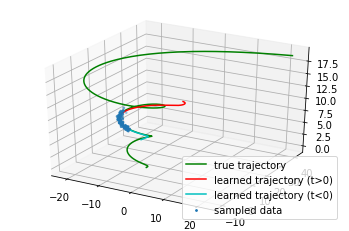

Iter: 3675, running avg elbo: -6262.2660


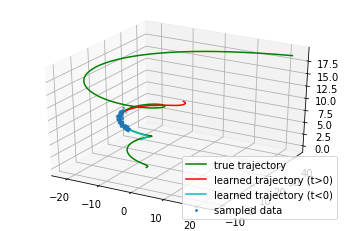

Iter: 3700, running avg elbo: -6221.4229


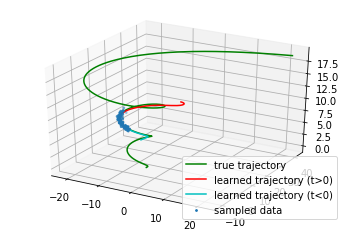

Iter: 3725, running avg elbo: -6181.1248


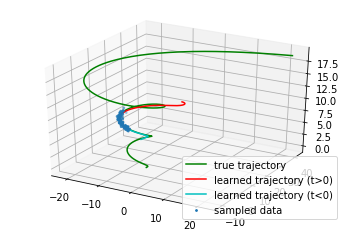

Iter: 3750, running avg elbo: -6141.3623


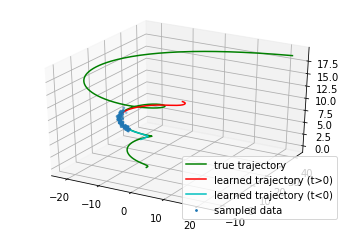

Stored ckpt at ./ckpt.pth
Iter: 3775, running avg elbo: -6102.1166


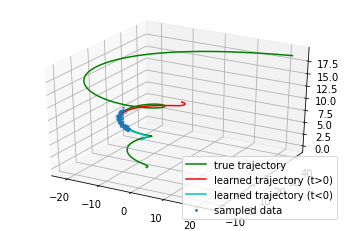

Iter: 3800, running avg elbo: -6063.3783


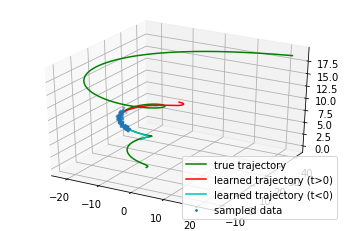

Iter: 3825, running avg elbo: -6025.1407


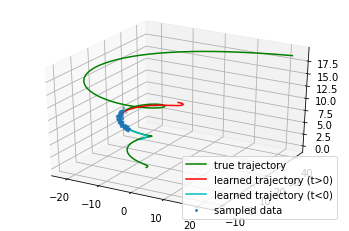

Iter: 3850, running avg elbo: -5987.3950


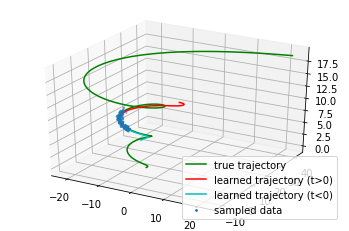

Iter: 3875, running avg elbo: -5950.1325


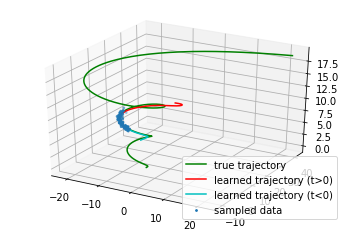

Iter: 3900, running avg elbo: -5913.3455


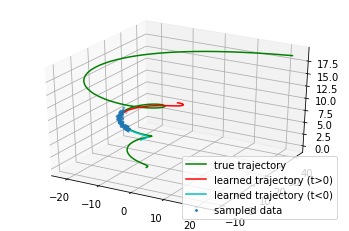

Iter: 3925, running avg elbo: -5877.0187


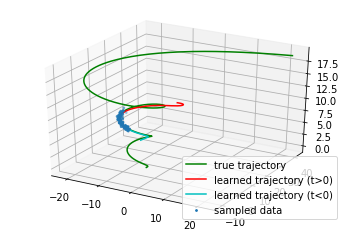

Iter: 3950, running avg elbo: -5841.1467


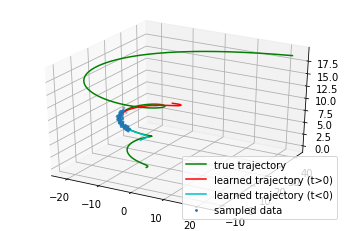

Iter: 3975, running avg elbo: -5805.7240


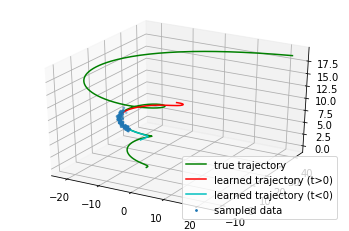

Iter: 4000, running avg elbo: -5770.7377


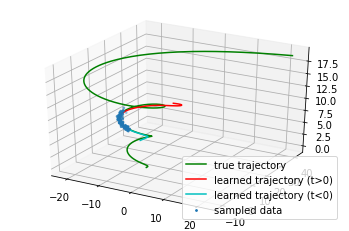

Stored ckpt at ./ckpt.pth
Iter: 4025, running avg elbo: -5736.1819


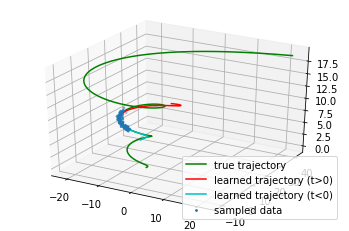

Iter: 4050, running avg elbo: -5702.0483


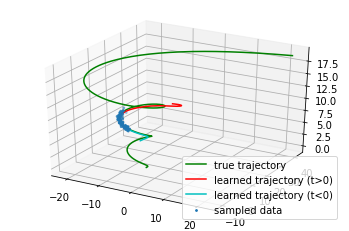

Iter: 4075, running avg elbo: -5668.3309


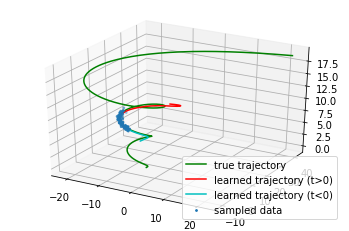

Iter: 4100, running avg elbo: -5635.0188


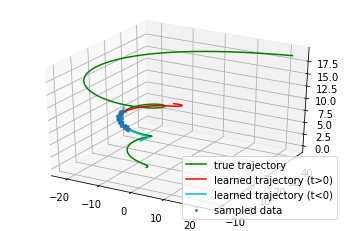

Iter: 4125, running avg elbo: -5602.1065


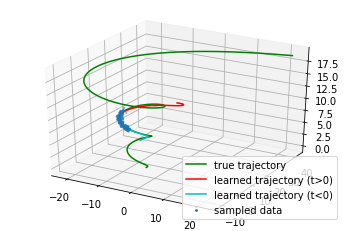

Iter: 4150, running avg elbo: -5569.5881


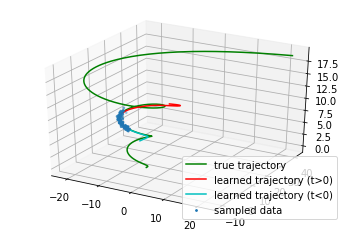

Iter: 4175, running avg elbo: -5537.4548


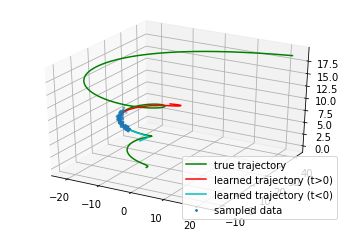

Iter: 4200, running avg elbo: -5505.7019


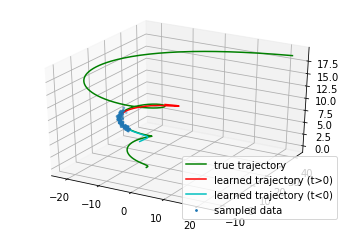

Iter: 4225, running avg elbo: -5474.3195


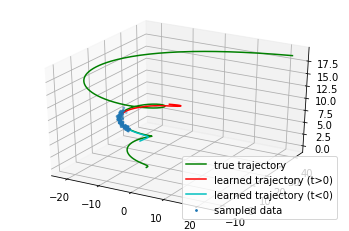

Iter: 4250, running avg elbo: -5443.3028


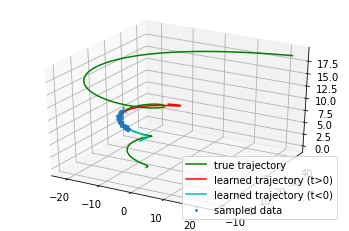

Stored ckpt at ./ckpt.pth
Iter: 4275, running avg elbo: -5412.6445


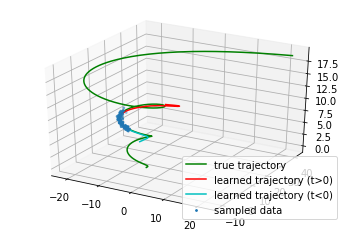

Iter: 4300, running avg elbo: -5382.3410


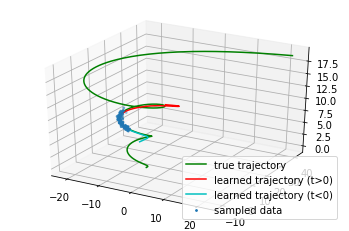

Iter: 4325, running avg elbo: -5352.3833


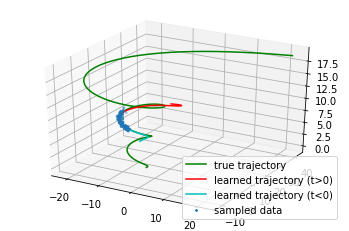

Iter: 4350, running avg elbo: -5322.7641


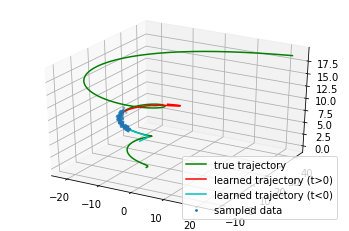

Iter: 4375, running avg elbo: -5293.4817


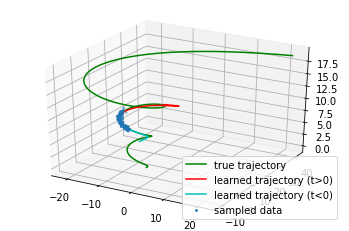

Iter: 4400, running avg elbo: -5264.5282


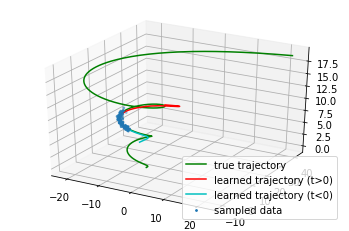

Iter: 4425, running avg elbo: -5235.8981


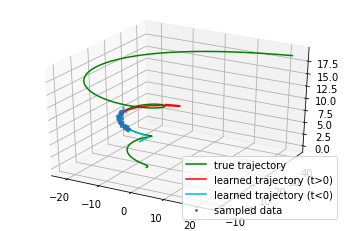

Iter: 4450, running avg elbo: -5207.5860


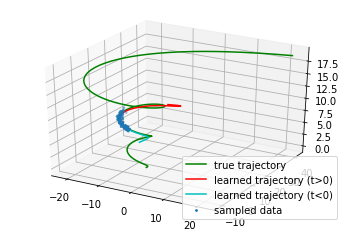

Iter: 4475, running avg elbo: -5179.5856


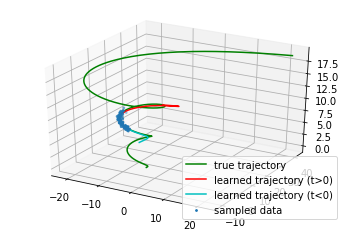

Iter: 4500, running avg elbo: -5151.8930


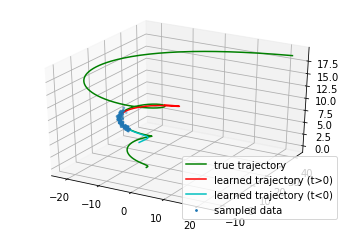

Stored ckpt at ./ckpt.pth
Iter: 4525, running avg elbo: -5124.5044


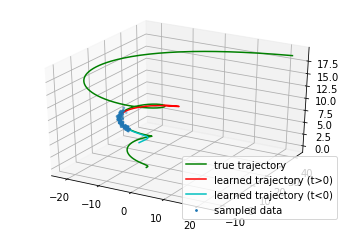

Iter: 4550, running avg elbo: -5097.4131


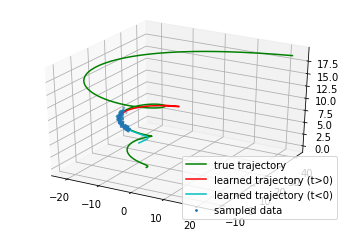

Iter: 4575, running avg elbo: -5070.6134


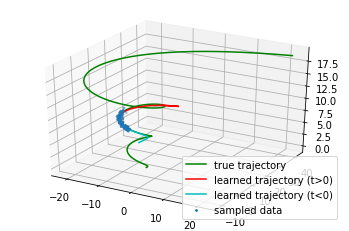

Iter: 4600, running avg elbo: -5044.1029


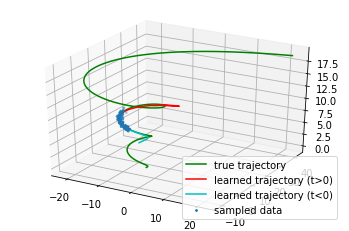

Iter: 4625, running avg elbo: -5017.8741


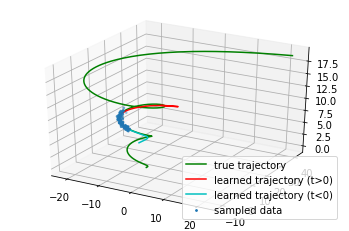

Iter: 4650, running avg elbo: -4991.9257


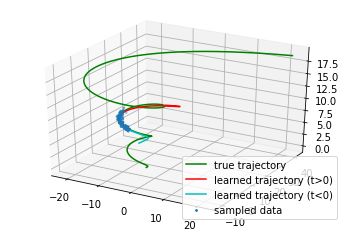

Iter: 4675, running avg elbo: -4966.2528


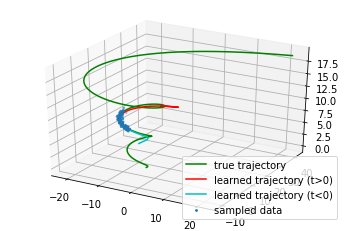

Iter: 4700, running avg elbo: -4940.8473


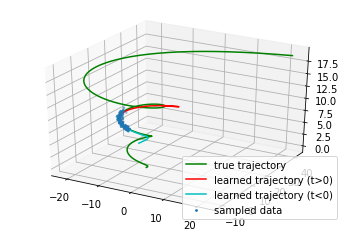

Iter: 4725, running avg elbo: -4915.7110


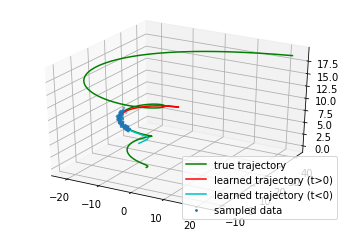

Iter: 4750, running avg elbo: -4890.8340


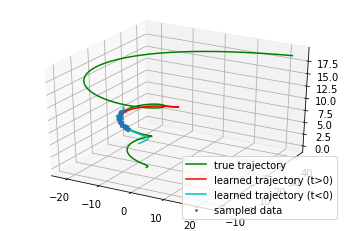

Stored ckpt at ./ckpt.pth
Iter: 4775, running avg elbo: -4866.2161


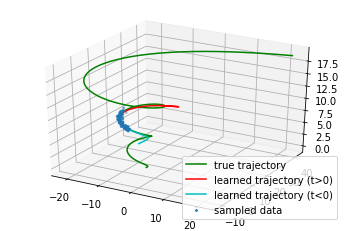

Iter: 4800, running avg elbo: -4841.8501


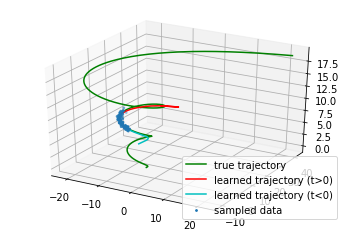

Iter: 4825, running avg elbo: -4817.7337


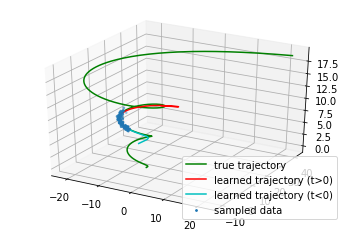

Iter: 4850, running avg elbo: -4793.8635


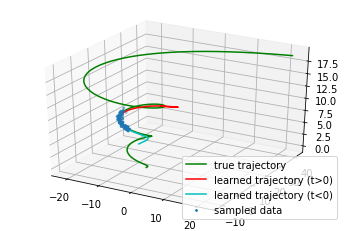

Iter: 4875, running avg elbo: -4770.2323


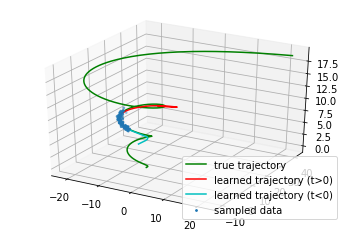

Iter: 4900, running avg elbo: -4746.8422


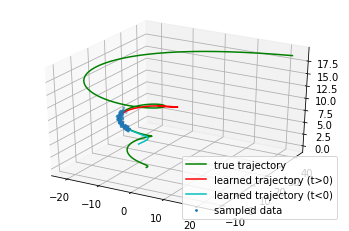

Iter: 4925, running avg elbo: -4723.6867


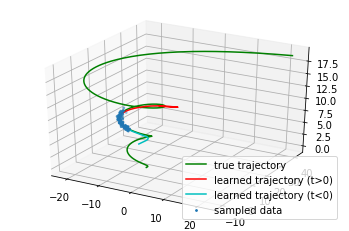

Iter: 4950, running avg elbo: -4700.7606


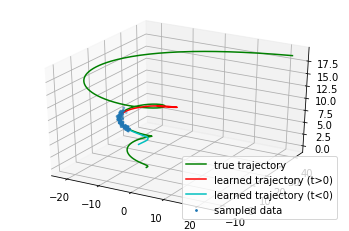

Iter: 4975, running avg elbo: -4678.0620


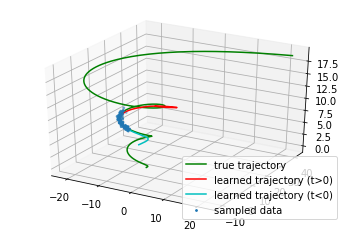

Iter: 5000, running avg elbo: -4655.5892


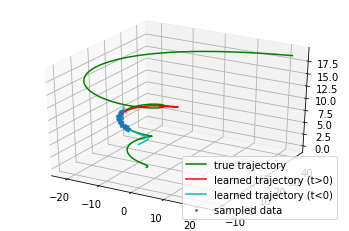

Stored ckpt at ./ckpt.pth
Training complete after 5000 iters.


In [13]:
# Import non-adjoint backpropagation
from torchdiffeq import odeint

visualize = True
train_dir = './'
n_iters = 5000
opt_lr = 0.001

latent_dim = 6
nhidden = 20
rnn_nhidden = 25
obs_dim = 3
nspiral = 1000
start = 0.
stop = 6 * np.pi
noise_std = .3
a = 0.
b = 1.
ntotal = 1000
nsample = 100
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# generate toy spiral data
orig_trajs, samp_trajs, orig_ts, samp_ts = generate_spiral3d(
    nspiral=nspiral,
    start=start,
    stop=stop,
    noise_std=noise_std,
    a=a, b=b
)
orig_trajs = torch.from_numpy(orig_trajs).float().to(device)
samp_trajs = torch.from_numpy(samp_trajs).float().to(device)
samp_ts = torch.from_numpy(samp_ts).float().to(device)

# model
func = LatentODEfunc(latent_dim, nhidden).to(device)
rec = RecognitionRNN(latent_dim, obs_dim, rnn_nhidden, nspiral).to(device)
dec = Decoder(latent_dim, obs_dim, nhidden).to(device)
params = (list(func.parameters()) + list(dec.parameters()) + list(rec.parameters()))
optimizer = optim.Adam(params, lr=opt_lr)
loss_meter = RunningAverageMeter()

if train_dir is not None:
    if not os.path.exists(train_dir):
        os.makedirs(train_dir)
    ckpt_path = os.path.join(train_dir, 'ckpt.pth')
    if os.path.exists(ckpt_path):
        checkpoint = torch.load(ckpt_path)
        func.load_state_dict(checkpoint['func_state_dict'])
        rec.load_state_dict(checkpoint['rec_state_dict'])
        dec.load_state_dict(checkpoint['dec_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        orig_trajs = checkpoint['orig_trajs']
        samp_trajs = checkpoint['samp_trajs']
        orig_ts = checkpoint['orig_ts']
        samp_ts = checkpoint['samp_ts']
        print('Loaded ckpt from {}'.format(ckpt_path))

try:
    for itr in range(1, n_iters + 1):
        optimizer.zero_grad()
        # backward in time to infer q(z_0)
        h = rec.initHidden().to(device)
        for t in reversed(range(samp_trajs.size(1))):
            obs = samp_trajs[:, t, :]
            out, h = rec.forward(obs, h)
        qz0_mean, qz0_logvar = out[:, :latent_dim], out[:, latent_dim:]
        epsilon = torch.randn(qz0_mean.size()).to(device)
        z0 = epsilon * torch.exp(.5 * qz0_logvar) + qz0_mean

        # forward in time and solve ode for reconstructions
        pred_z = odeint(func, z0, samp_ts).permute(1, 0, 2)
        pred_x = dec(pred_z)

        # compute loss
        noise_std_ = torch.zeros(pred_x.size()).to(device) + noise_std
        noise_logvar = 2. * torch.log(noise_std_).to(device)
        logpx = log_normal_pdf(
            samp_trajs, pred_x, noise_logvar).sum(-1).sum(-1)
        pz0_mean = pz0_logvar = torch.zeros(z0.size()).to(device)
        analytic_kl = normal_kl(qz0_mean, qz0_logvar,
                                pz0_mean, pz0_logvar).sum(-1)
        loss = torch.mean(-logpx + analytic_kl, dim=0)
        loss.backward()
        optimizer.step()
        loss_meter.update(loss.item())

        if itr % 25 == 0:
            print('Iter: {}, running avg elbo: {:.4f}'.format(itr, -loss_meter.avg))

            if visualize:
                with torch.no_grad():
                    # sample from trajectorys' approx. posterior
                    h = rec.initHidden().to(device)
                    for t in reversed(range(samp_trajs.size(1))):
                        obs = samp_trajs[:, t, :]
                        out, h = rec.forward(obs, h)
                    qz0_mean, qz0_logvar = out[:, :latent_dim], out[:, latent_dim:]
                    epsilon = torch.randn(qz0_mean.size()).to(device)
                    z0 = epsilon * torch.exp(.5 * qz0_logvar) + qz0_mean
                    if isinstance(orig_ts, np.ndarray):
                        orig_ts = torch.from_numpy(orig_ts).float().to(device)

                    # take first trajectory for visualization
                    z0 = z0[0]

                    ts_pos = np.linspace(0., 2. * np.pi, num=2000)
                    ts_neg = np.linspace(-np.pi, 0., num=2000)[::-1].copy()
                    ts_pos = torch.from_numpy(ts_pos).float().to(device)
                    ts_neg = torch.from_numpy(ts_neg).float().to(device)

                    zs_pos = odeint(func, z0, ts_pos)
                    zs_neg = odeint(func, z0, ts_neg)

                    xs_pos = dec(zs_pos)
                    xs_neg = torch.flip(dec(zs_neg), dims=[0])

                xs_pos = xs_pos.cpu().numpy()
                xs_neg = xs_neg.cpu().numpy()
                orig_traj = orig_trajs[0].cpu().numpy()
                samp_traj = samp_trajs[0].cpu().numpy()

                plt.figure()
                ax = plt.axes(projection='3d')
                ax.plot3D(orig_traj[:, 0], orig_traj[:, 1], orig_traj[:, 2],
                        'g', label='true trajectory')
                ax.plot3D(xs_pos[:, 0], xs_pos[:, 1], xs_pos[:, 2], 'r',
                        label='learned trajectory (t>0)')
                ax.plot3D(xs_neg[:, 0], xs_neg[:, 1], xs_neg[:, 2], 'c',
                        label='learned trajectory (t<0)')
                ax.scatter3D(samp_traj[:, 0], samp_traj[:, 1], samp_traj[:, 2], label='sampled data', s=3)
                plt.legend()
                plt.show()
                plt.close()

        if itr % 250 == 0:
            if train_dir is not None:
                ckpt_path = os.path.join(train_dir, 'ckpt.pth')
                torch.save({
                    'func_state_dict': func.state_dict(),
                    'rec_state_dict': rec.state_dict(),
                    'dec_state_dict': dec.state_dict(),
                    'optimizer_state_dict': optimizer.state_dict(),
                    'orig_trajs': orig_trajs,
                    'samp_trajs': samp_trajs,
                    'orig_ts': orig_ts,
                    'samp_ts': samp_ts,
                }, ckpt_path)
                print('Stored ckpt at {}'.format(ckpt_path))

except KeyboardInterrupt:
    if train_dir is not None:
        ckpt_path = os.path.join(train_dir, 'ckpt.pth')
        torch.save({
            'func_state_dict': func.state_dict(),
            'rec_state_dict': rec.state_dict(),
            'dec_state_dict': dec.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'orig_trajs': orig_trajs,
            'samp_trajs': samp_trajs,
            'orig_ts': orig_ts,
            'samp_ts': samp_ts,
        }, ckpt_path)
        print('Stored ckpt at {}'.format(ckpt_path))
print('Training complete after {} iters.'.format(itr))

plt.close('all')

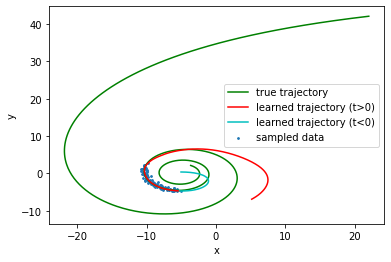

In [18]:
plt.figure()
plt.plot(orig_traj[:, 0], orig_traj[:, 1],
        'g', label='true trajectory')
plt.plot(xs_pos[:, 0], xs_pos[:, 1], 'r',
        label='learned trajectory (t>0)')
plt.plot(xs_neg[:, 0], xs_neg[:, 1], 'c',
        label='learned trajectory (t<0)')
plt.scatter(samp_traj[:, 0], samp_traj[:, 1], label='sampled data', s=3)
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()
plt.close()

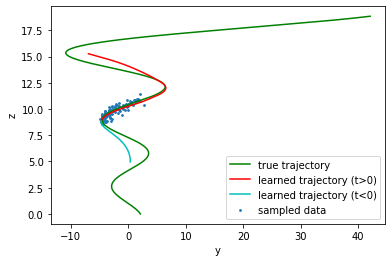

In [20]:
plt.figure()
plt.plot(orig_traj[:, 1], orig_traj[:, 2],
        'g', label='true trajectory')
plt.plot(xs_pos[:, 1], xs_pos[:, 2], 'r',
        label='learned trajectory (t>0)')
plt.plot(xs_neg[:, 1], xs_neg[:, 2], 'c',
        label='learned trajectory (t<0)')
plt.scatter(samp_traj[:, 1], samp_traj[:, 2], label='sampled data', s=3)
plt.xlabel('y')
plt.ylabel('z')
plt.legend()
plt.show()
plt.close()

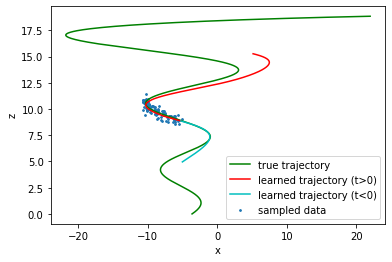

In [19]:
plt.figure()
plt.plot(orig_traj[:, 0], orig_traj[:, 2],
        'g', label='true trajectory')
plt.plot(xs_pos[:, 0], xs_pos[:, 2], 'r',
        label='learned trajectory (t>0)')
plt.plot(xs_neg[:, 0], xs_neg[:, 2], 'c',
        label='learned trajectory (t<0)')
plt.scatter(samp_traj[:, 0], samp_traj[:, 2], label='sampled data', s=3)
plt.xlabel('x')
plt.ylabel('z')
plt.legend()
plt.show()
plt.close()